# Map POIs

#### Primary Author
Chris Carey

#### Description:
This notebook plots the locations of points of interest (POI) by category.

#### Inputs:
```
data/nyc_cbgs.geojson
data/cbg_attr_and_cluster_1021.csv
exports/poi_health_recategorized.csv
```
 
#### Visualizations:
> Location plot of POIs by category\
> Choropleth of POIs per capita by census block group (CBG)

In [1]:
import geopandas as gpd
import math
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

In [2]:
CRS = 'EPSG:2263'

In [3]:
def peek(df):
    display(df.iloc[0:3, :])
    print(len(df))

In [4]:
cbg_gdf = gpd.read_file('./data/nyc_cbgs.geojson')
cbg_gdf = cbg_gdf.to_crs(CRS)
cbg_gdf = cbg_gdf.rename(columns={
    'CensusBlockGroup': 'cbg',
})
cbg_gdf['cbg'] = cbg_gdf['cbg'].astype(int)
cbg_gdf = cbg_gdf[['cbg', 'geometry']]

cbg_df = pd.read_csv('./data/cbg_attr_and_cluster_1021.csv')
cbg_df = cbg_df.rename(columns={
    'census_block_group': 'cbg',
    'Cluster': 'cluster',
    'Total Population': 'population',
})
cbg_df = cbg_df[['cbg', 'cluster', 'population']]
cbg_df['cluster'] = cbg_df['cluster'].astype('category')

cbg_gdf = cbg_gdf.merge(cbg_df, how='inner', on=['cbg'])

In [5]:
poi_df = pd.read_csv('./exports/poi_health_recategorized.csv')
peek(poi_df)

,placekey,cbg,naics_code,category,sub_category,location_name,area_square_feet,latitude,longitude
0,222-222@627-s94-nwk,360470395002,445210,Specialty Food Stores,Meat Markets,Broadway Meats,3177.0,40.691436,-73.924891
1,223-222@627-rw6-zfz,360050386008,445110,Supermarkets,Supermarkets and Other Grocery (except Conveni...,Foodtown,3401.0,40.876890,-73.847776
2,223-222@627-rwq-vcq,360050117001,445110,Supermarkets,Supermarkets and Other Grocery (except Conveni...,Kirsch Mushroom Company,10079.0,40.816779,-73.883401


36475


In [6]:
poi_gdf = gpd.GeoDataFrame(poi_df,
                           geometry=gpd.points_from_xy(poi_df['longitude'],
                                                       poi_df['latitude']),
                           crs='EPSG:4326')
poi_gdf = poi_gdf.to_crs(CRS)

In [7]:
def plot_locations(gdf, attr, SIZE=10):
    attrs = list(set(gdf[attr]))
    attrs.sort()
    n_attr = len(attrs)
    fig, ax = plt.subplots(n_attr, 1, figsize=(SIZE, SIZE * n_attr))
    for i, attr_value in enumerate(attrs):
        cbg_gdf.plot(ax=ax[i], color='#eee')
        poi_gdf[poi_gdf[attr] == attr_value].plot(ax=ax[i],
                                                  color=f'C{i % 6}',
                                                  markersize=1,
                                                  alpha=0.5)
        ax[i].set_title(attr_value)
    plt.tight_layout()
    plt.show()

In [8]:
categories = list(set(poi_gdf['category']))
categories.sort()
display(categories)

['Beer, Wine, and Liquor Stores',
 'Big Box Grocers',
 'Delis and Convenience Stores',
 'Drinking Places',
 'Fast-Food Restaurants',
 'Food Services',
 'Full-Service Restaurants',
 'General Merchandise Stores',
 'Limited-Service Restaurants',
 'Pharmacies and Drug Stores',
 'Snacks and Bakeries',
 'Specialty Food Stores',
 'Supermarkets',
 'Tobacco Stores']

In [9]:
join_gdf = cbg_gdf.merge(poi_gdf.drop(columns=['geometry']),
                         on='cbg',
                         how='left')

In [10]:
poi_pivot_gdf = poi_df[['cbg', 'placekey', 'category']]
poi_pivot_gdf = poi_pivot_gdf.groupby(
    by=['cbg', 'category']).count().reset_index()
poi_pivot_gdf = poi_pivot_gdf.pivot(index='cbg',
                                    columns=['category'],
                                    values='placekey').reset_index()
poi_pivot_gdf = poi_pivot_gdf.fillna(0)
poi_pivot_gdf = poi_pivot_gdf.iloc[:, :].astype(int)
peek(poi_pivot_gdf)

category,cbg,"Beer, Wine, and Liquor Stores",Big Box Grocers,Delis and Convenience Stores,Drinking Places,Fast-Food Restaurants,Food Services,Full-Service Restaurants,General Merchandise Stores,Limited-Service Restaurants,Pharmacies and Drug Stores,Snacks and Bakeries,Specialty Food Stores,Supermarkets,Tobacco Stores
0,360050002001,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,360050002002,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,360050004001,0,0,1,0,0,0,1,0,0,0,0,0,0,0


4708


In [11]:
join_gdf = cbg_gdf.merge(poi_pivot_gdf, on='cbg', how='left')
join_gdf = join_gdf.fillna(0)

poi_area_gdf = join_gdf
# Divide counts by CBG Area
for i in range(4, 10):
    poi_area_gdf.iloc[:, i] = poi_area_gdf.iloc[:, i] / (
        poi_area_gdf['geometry'].geometry.area * 1000)

poi_population_gdf = join_gdf
# Divide counts by Population
for i in range(4, 10):
    poi_population_gdf.iloc[:, i] = poi_population_gdf.iloc[:, i] / (
        poi_population_gdf['population'])
peek(poi_population_gdf)

,cbg,geometry,cluster,population,"Beer, Wine, and Liquor Stores",Big Box Grocers,Delis and Convenience Stores,Drinking Places,Fast-Food Restaurants,Food Services,Full-Service Restaurants,General Merchandise Stores,Limited-Service Restaurants,Pharmacies and Drug Stores,Snacks and Bakeries,Specialty Food Stores,Supermarkets,Tobacco Stores
0,360050175002,"MULTIPOLYGON (((1007579.278 241875.151, 100781...",2,656,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,360050141001,"MULTIPOLYGON (((1007327.986 239855.027, 100751...",2,1228,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,360050145001,"MULTIPOLYGON (((1010307.431 242068.478, 101052...",2,2716,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


6221


In [12]:
def plot_choropleths(gdf, attrs, title_suffix, SIZE=10):
    n_attrs = len(attrs)
    fig, ax = plt.subplots(n_attrs, 1, figsize=(SIZE, SIZE * n_attrs))
    cmaps = ['Blues', 'Oranges', 'Greens', 'Reds', 'Purples', 'Greys']
    for i, attr in enumerate(attrs):
        try:
            gdf.plot(ax=ax[i],
                     column=attr,
                     cmap=cmaps[i % 6],
                     scheme='FisherJenksSampled',
                     legend=True,
                     edgecolor='#999',
                     linewidth=0.1)
            ax[i].set_title(f'{attr} {title_suffix}')
        except:
            print(f'Error with {attr}')
    plt.tight_layout()
    plt.show()

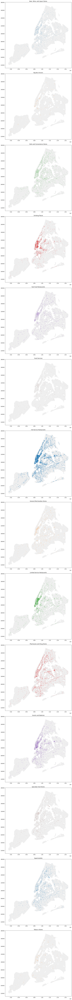

Error with Tobacco Stores


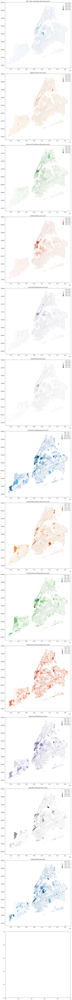

Error with Tobacco Stores


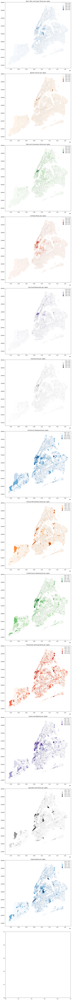

In [13]:
plot_locations(poi_gdf, 'category')
plot_choropleths(poi_area_gdf, categories, 'per sq km')
plot_choropleths(poi_population_gdf, categories, 'per capita')